In [64]:
import warnings; 
warnings.filterwarnings("ignore")
warnings.simplefilter(action="ignore",category=UserWarning)
warnings.simplefilter(action="ignore",category=FutureWarning)


# Interactive plots embedded within the notebook
#%matplotlib notebook 
# Static images of plots embedded within the notebook
#%matplotlib inline   
%config InlineBackend.figure_formats = {'png', 'retina'}

from IPython.core.interactiveshell import InteractiveShell
InteractiveShell.ast_node_interactivity = "all"

from scipy import stats

import numpy as np
import scipy as sp
import matplotlib as mpl
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import statsmodels as stm
import statsmodels.api as sm
from platform import python_version

#pd.options.plotting.backend = "plotly" 
# Conflict with options in original matplotlib.

print('Python version', python_version())
print('Numpy version', np.__version__)
print('Scipy version', sp.__version__)
print('Pandas version', pd.__version__)
print('Matplotlib version', mpl.__version__)
print('Seaborn version', sns.__version__)
print('Statsmodels version', stm.__version__)
###############################################

#plt.style.use('ggplot')
plt.style.use('seaborn-v0_8-muted')
plt.rcParams['figure.figsize'] = (6, 6)
plt.rcParams['grid.linestyle'] = ':'   
plt.rcParams['axes.grid'] = False

sns.set_style("whitegrid", {'axes.grid' : False})
#sns.color_palette("RdBu", n_colors=10)
#sns.color_palette("RdBu_r') # Good for heatmap

Python version 3.13.7
Numpy version 2.3.3
Scipy version 1.16.2
Pandas version 2.3.3
Matplotlib version 3.10.6
Seaborn version 0.13.2
Statsmodels version 0.14.5


In [65]:
df = pd.read_csv("test.csv")
df.drop(columns=['player_id'], inplace=True)

df.head()

,id,login_count_1,login_count_2,login_count_3,login_count_4,login_lat_1,login_lon_1,login_lat_2,login_lon_2,login_lat_3,...,guild_changes_1,guild_changes_2,guild_changes_3,guild_changes_4,account_age_days,behavior_stability,password_changed,vpn_usage,suspicious_login_time,mass_item_sale
0,ANS00001,31.222232,41.790417,28.048736,NaN,-17.074035,127.285635,-17.554811,126.865553,-18.679380,...,1.0,2.0,2.0,1.0,580.020715,0.830282,0.0,1.0,0.0,0.0
1,ANS00002,61.358999,49.209284,NaN,NaN,48.430879,25.555743,48.708993,26.733951,48.706072,...,0.0,-1.0,-1.0,1.0,1306.627890,0.700770,0.0,NaN,0.0,0.0
2,ANS00003,24.763478,37.723228,26.879628,32.503285,8.252684,40.788695,8.346856,40.688039,8.630887,...,0.0,1.0,-1.0,0.0,835.638378,0.797991,0.0,0.0,0.0,0.0
3,ANS00004,82.100747,74.862388,73.520927,83.495309,-28.728293,178.990465,-29.104994,178.810800,-28.198793,...,2.0,2.0,1.0,3.0,NaN,0.736845,0.0,NaN,0.0,0.0
4,ANS00005,50.901216,70.636572,55.606357,68.179388,-46.833704,167.886402,-47.372141,166.767058,-47.828834,...,NaN,-1.0,0.0,0.0,379.053416,0.818901,NaN,0.0,0.0,0.0


In [66]:
total = 0
for col in df.columns.tolist():
    total += df[col].isna().sum()
    if df[col].isna().sum() > 0:
        print(f'Column: {col}, NaN: {df[col].isna().sum()}')
print(f'Avg NaN per feature: {total/len(df.columns):.1f}')

Column: login_count_1, NaN: 1225
Column: login_count_2, NaN: 1269
Column: login_count_3, NaN: 1228
Column: login_count_4, NaN: 1320
Column: login_lat_1, NaN: 1270
Column: login_lon_1, NaN: 1322
Column: login_lat_2, NaN: 1240
Column: login_lon_2, NaN: 1245
Column: login_lat_3, NaN: 1284
Column: login_lon_3, NaN: 1281
Column: login_lat_4, NaN: 1278
Column: login_lon_4, NaN: 1284
Column: location_changes_1, NaN: 1249
Column: location_changes_2, NaN: 1300
Column: location_changes_3, NaN: 1298
Column: location_changes_4, NaN: 1239
Column: device_count_1, NaN: 1297
Column: device_count_2, NaN: 1294
Column: device_count_3, NaN: 1260
Column: device_count_4, NaN: 1291
Column: ip_hash_entropy_1, NaN: 1363
Column: ip_hash_entropy_2, NaN: 1310
Column: ip_hash_entropy_3, NaN: 1187
Column: ip_hash_entropy_4, NaN: 1280
Column: login_time_variance_1, NaN: 1264
Column: login_time_variance_2, NaN: 1251
Column: login_time_variance_3, NaN: 1262
Column: login_time_variance_4, NaN: 1235
Column: session_dura

In [67]:
df['behavior_stability'].fillna(df['behavior_stability'].median(), inplace=True)
df['account_age_days'].fillna(df['account_age_days'].median(), inplace=True)

df['password_changed'].fillna(df['password_changed'].median(), inplace=True)
df['vpn_usage'].fillna(df['vpn_usage'].median(), inplace=True)
df['suspicious_login_time'].fillna(df['suspicious_login_time'].median(), inplace=True)
df['mass_item_sale'].fillna(df['mass_item_sale'].median(), inplace=True)

In [68]:
# res = df['id']
df.drop(columns=['id'], inplace=True)
for col in df.columns:
    print(f"Skewness of {col} : {df[col].skew()}")
# df.drop(columns=['label_if'], inplace=True)

Skewness of login_count_1 : 0.19055604253557115
Skewness of login_count_2 : 0.34335919849708807
Skewness of login_count_3 : 0.27319796745574226
Skewness of login_count_4 : 0.11856017775670387
Skewness of login_lat_1 : 0.0010328189954095025
Skewness of login_lon_1 : -0.0066107149978942735
Skewness of login_lat_2 : 0.0019611716981341883
Skewness of login_lon_2 : -0.006679019281808157
Skewness of login_lat_3 : -0.002897862628456529
Skewness of login_lon_3 : -0.009214506689111314
Skewness of login_lat_4 : 0.05151856886211397
Skewness of login_lon_4 : -0.004999046962457774
Skewness of location_changes_1 : 0.5563985776606154
Skewness of location_changes_2 : 0.4097813315007771
Skewness of location_changes_3 : 0.2699598619805993
Skewness of location_changes_4 : 5.140934328038621
Skewness of device_count_1 : 0.020984868132386553
Skewness of device_count_2 : 0.013902364955408543
Skewness of device_count_3 : 0.01607980921312137
Skewness of device_count_4 : 0.0689710555326613
Skewness of ip_hash_e

In [69]:
def create_trend_features(df: pd.DataFrame) -> pd.DataFrame:
    df_new = df.copy()
    all_cols = df.columns

    prefixes = set(
        col.rsplit("_", 1)[0]
        for col in all_cols
        if col.endswith(("_1", "_2", "_3", "_4"))
    )

    x = np.array([1, 2, 3, 4], dtype=float)
    mean_x = x.mean()
    denom = np.sum((x - mean_x) ** 2)

    for prefix in prefixes:
        cols = [f"{prefix}_1", f"{prefix}_2", f"{prefix}_3", f"{prefix}_4"]
        if not all(c in df_new.columns for c in cols):
            df_new[f"{prefix}_total"] = 0
            df_new[f"{prefix}_mean"] = 0

        else:
            df_new[f"{prefix}_total"] = df_new[cols].sum(axis=1)
            df_new[f"{prefix}_mean"] = df_new[cols].mean(axis=1)

        y = df_new[cols].values.astype(float)
        y_filled = np.nan_to_num(y)
        mean_y = y_filled.mean(axis=1, keepdims=True)

        num = np.sum((y_filled - mean_y) * (x - mean_x), axis=1)
        slope = num / denom
        df_new[f"{prefix}_trend"] = slope

    return df_new

In [70]:
from sklearn.decomposition import PCA
import seaborn as sns
import matplotlib.pyplot as plt

def plot_anomalies(X_scaled, is_anomaly):
    pca = PCA(n_components=2, random_state=42)
    X_pca = pca.fit_transform(X_scaled)

    plt.figure(figsize=(10, 6))
    plt.scatter(
        X_pca[is_anomaly == 0, 0],
        X_pca[is_anomaly == 0, 1],
        s=8,
        alpha=0.8,
        label="Normal",
    )
    plt.scatter(
        X_pca[is_anomaly == 1, 0],
        X_pca[is_anomaly == 1, 1],
        s=20,
        alpha=0.4,
        marker="x",
        label="Anomaly",
    )
    plt.title("Anomaly Detection (PCA 2D Projection)")
    plt.xlabel("PC 1")
    plt.ylabel("PC 2")
    plt.legend()
    plt.grid(True, alpha=0.3)
    plt.show()

    # # 7.2 Histogram of ensemble scores
    # plt.figure(figsize=(8, 4))
    # plt.hist(ensemble_score, bins=50)
    # plt.axvline(threshold, color="red", linestyle="--", label="threshold")
    # plt.title("Distribution of Ensemble Anomaly Scores")
    # plt.xlabel("ensemble_score (higher = more suspicious)")
    # plt.ylabel("count")
    # plt.legend()
    # plt.grid(True, alpha=0.3)
    # plt.show()

In [71]:
def median_impute(df: pd.DataFrame) -> pd.DataFrame:
    feature_groups = {
        'login_count': ['login_count_1', 'login_count_2', 'login_count_3', 'login_count_4'],
        'login_lat': ['login_lat_1', 'login_lat_2', 'login_lat_3', 'login_lat_4'],
        'login_lon': ['login_lon_1', 'login_lon_2', 'login_lon_3', 'login_lon_4'],
        'location_changes': ['location_changes_1', 'location_changes_2', 'location_changes_3', 'location_changes_4'],
        'device_count': ['device_count_1', 'device_count_2', 'device_count_3', 'device_count_4'],
        'ip_hash_entropy': ['ip_hash_entropy_1', 'ip_hash_entropy_2', 'ip_hash_entropy_3', 'ip_hash_entropy_4'],
        'login_time_variance': ['login_time_variance_1', 'login_time_variance_2', 'login_time_variance_3', 'login_time_variance_4'],
        'session_duration_mean': ['session_duration_mean_1', 'session_duration_mean_2', 'session_duration_mean_3', 'session_duration_mean_4'],
        'session_duration_std': ['session_duration_std_1', 'session_duration_std_2', 'session_duration_std_3', 'session_duration_std_4'],
        'play_pattern_consistency': ['play_pattern_consistency_1', 'play_pattern_consistency_2', 'play_pattern_consistency_3', 'play_pattern_consistency_4'],
        'activity_level': ['activity_level_1', 'activity_level_2', 'activity_level_3', 'activity_level_4'],
        'skill_rating': ['skill_rating_1', 'skill_rating_2', 'skill_rating_3', 'skill_rating_4'],
        'skill_trajectory': ['skill_trajectory_1', 'skill_trajectory_2', 'skill_trajectory_3', 'skill_trajectory_4'],
        'kda_mean': ['kda_mean_1', 'kda_mean_2', 'kda_mean_3', 'kda_mean_4'],
        'kda_std': ['kda_std_1', 'kda_std_2', 'kda_std_3', 'kda_std_4'],
        'accuracy_mean': ['accuracy_mean_1', 'accuracy_mean_2', 'accuracy_mean_3', 'accuracy_mean_4'],
        'accuracy_std': ['accuracy_std_1', 'accuracy_std_2', 'accuracy_std_3', 'accuracy_std_4'],
        'reaction_time_mean': ['reaction_time_mean_1', 'reaction_time_mean_2', 'reaction_time_mean_3', 'reaction_time_mean_4'],
        'reaction_time_std': ['reaction_time_std_1', 'reaction_time_std_2', 'reaction_time_std_3', 'reaction_time_std_4'],
        'performance_stability': ['performance_stability_1', 'performance_stability_2', 'performance_stability_3', 'performance_stability_4'],
        'purchase_frequency': ['purchase_frequency_1', 'purchase_frequency_2', 'purchase_frequency_3', 'purchase_frequency_4'],
        'purchase_amount_mean': ['purchase_amount_mean_1', 'purchase_amount_mean_2', 'purchase_amount_mean_3', 'purchase_amount_mean_4'],
        'purchase_amount_std': ['purchase_amount_std_1', 'purchase_amount_std_2', 'purchase_amount_std_3', 'purchase_amount_std_4'],
        'refund_count': ['refund_count_1', 'refund_count_2', 'refund_count_3', 'refund_count_4'],
        'currency_transfers': ['currency_transfers_1', 'currency_transfers_2', 'currency_transfers_3', 'currency_transfers_4'],
        'friend_adds': ['friend_adds_1', 'friend_adds_2', 'friend_adds_3', 'friend_adds_4'],
        'friend_removes': ['friend_removes_1', 'friend_removes_2', 'friend_removes_3', 'friend_removes_4'],
        'communication_frequency': ['communication_frequency_1', 'communication_frequency_2', 'communication_frequency_3', 'communication_frequency_4'],
        'guild_changes': ['guild_changes_1', 'guild_changes_2', 'guild_changes_3', 'guild_changes_4']
    }
    
    amount = 0
    total = df.isnull().any(axis=1).sum()
    for row in df[df.isnull().any(axis=1)].index:
        for _, features in feature_groups.items():
            feature_values = df.loc[row, features]
            if feature_values.dropna().empty:
                median_value = 0.0
            else:
                median_value = feature_values.median()
            for feature in features:
                if pd.isna(df.loc[row, feature]):
                    df.loc[row, feature] = median_value
        amount += 1
        if amount % 100 == 0:
            print(f'Imputed {amount} / {total} rows')

    return df
        

In [72]:
# from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import RobustScaler
# from sklearn.impute import SimpleImputer

# imputer = SimpleImputer(strategy="median")
# df = imputer.fit_transform(df)
df_imputed = median_impute(df)
# df_trend = create_trend_features(df_imputed)
# scaler = StandardScaler()
scaler = RobustScaler()
df_scaled = scaler.fit_transform(df_imputed)


Imputed 100 / 25812 rows
Imputed 200 / 25812 rows
Imputed 300 / 25812 rows
Imputed 400 / 25812 rows
Imputed 500 / 25812 rows
Imputed 600 / 25812 rows
Imputed 700 / 25812 rows
Imputed 800 / 25812 rows
Imputed 900 / 25812 rows
Imputed 1000 / 25812 rows
Imputed 1100 / 25812 rows
Imputed 1200 / 25812 rows
Imputed 1300 / 25812 rows
Imputed 1400 / 25812 rows
Imputed 1500 / 25812 rows
Imputed 1600 / 25812 rows
Imputed 1700 / 25812 rows
Imputed 1800 / 25812 rows
Imputed 1900 / 25812 rows
Imputed 2000 / 25812 rows
Imputed 2100 / 25812 rows
Imputed 2200 / 25812 rows
Imputed 2300 / 25812 rows
Imputed 2400 / 25812 rows
Imputed 2500 / 25812 rows
Imputed 2600 / 25812 rows
Imputed 2700 / 25812 rows
Imputed 2800 / 25812 rows
Imputed 2900 / 25812 rows
Imputed 3000 / 25812 rows
Imputed 3100 / 25812 rows
Imputed 3200 / 25812 rows
Imputed 3300 / 25812 rows
Imputed 3400 / 25812 rows
Imputed 3500 / 25812 rows
Imputed 3600 / 25812 rows
Imputed 3700 / 25812 rows
Imputed 3800 / 25812 rows
Imputed 3900 / 25812 

In [73]:
from scipy.stats import skew
from scipy.stats import yeojohnson

df_transformed = df_scaled.copy()

for i in range(0, df_scaled.shape[1]):
    df_transformed[:, i], _ = yeojohnson(df_scaled[:, i])
    print(f"Skewness of {df.columns[i]} : {skew(df_transformed[:, i])}")

Skewness of login_count_1 : 0.031128720809974305
Skewness of login_count_2 : 0.04156109943198988
Skewness of login_count_3 : 0.0382395937615368
Skewness of login_count_4 : 0.022451303212406338
Skewness of login_lat_1 : -0.00016159082606008343
Skewness of login_lon_1 : 0.00012260531002914973
Skewness of login_lat_2 : -0.00013883843751144769
Skewness of login_lon_2 : 9.953265826401988e-05
Skewness of login_lat_3 : 0.0002834828080136391
Skewness of login_lon_3 : -7.754015589737298e-06
Skewness of login_lat_4 : 0.014522037019960176
Skewness of login_lon_4 : 0.0012621460109721186
Skewness of location_changes_1 : 0.061939750733952845
Skewness of location_changes_2 : 0.055571293175426986
Skewness of location_changes_3 : 0.04830817717318152
Skewness of location_changes_4 : 0.0384764655645361
Skewness of device_count_1 : 0.048838499098284374
Skewness of device_count_2 : -0.0502782773434803
Skewness of device_count_3 : -0.05015392546438678
Skewness of device_count_4 : 0.011089373187966815
Skewne

In [74]:
# from sklearn.preprocessing import StandardScaler
# scaler = StandardScaler()
# df_scaled = scaler.fit_transform(df_imputed)

In [75]:
df_scaled

array([[-0.68107532, -0.39201592, -0.7529884 , ...,  1.        ,
         0.        ,  0.        ],
       [ 0.0791473 , -0.20454903, -0.06178099, ...,  0.        ,
         0.        ,  0.        ],
       [-0.84400227, -0.49478949, -0.7826592 , ...,  0.        ,
         0.        ,  0.        ],
       ...,
       [ 0.91055323,  0.4302032 ,  1.26637985, ...,  0.        ,
         0.        ,  0.        ],
       [ 0.50714873,  0.23744393,  0.02163466, ...,  0.        ,
         0.        ,  0.        ],
       [ 0.31706842,  0.34078979,  0.72395347, ...,  0.        ,
         0.        ,  0.        ]], shape=(25889, 122))

In [76]:
total_nan = np.isnan(df_scaled).sum()
print(f"Total NaN values: {total_nan}")
df_scaled = np.nan_to_num(df_scaled)

Total NaN values: 0


# Isolation Forest

In [ ]:
# from sklearn.ensemble import IsolationForest

# iso_forest = IsolationForest(n_estimators=500, contamination=0.15, random_state=42, max_samples='auto')
# iso_forest.fit(df_imputed)
# anomaly_scores = iso_forest.decision_function(df_imputed)
# anomaly_labels = (iso_forest.predict(df_imputed) == -1).astype(int)

,n_estimators,500
,max_samples,'auto'
,contamination,0.15
,max_features,1.0
,bootstrap,False
,n_jobs,None
,random_state,42
,verbose,0
,warm_start,False


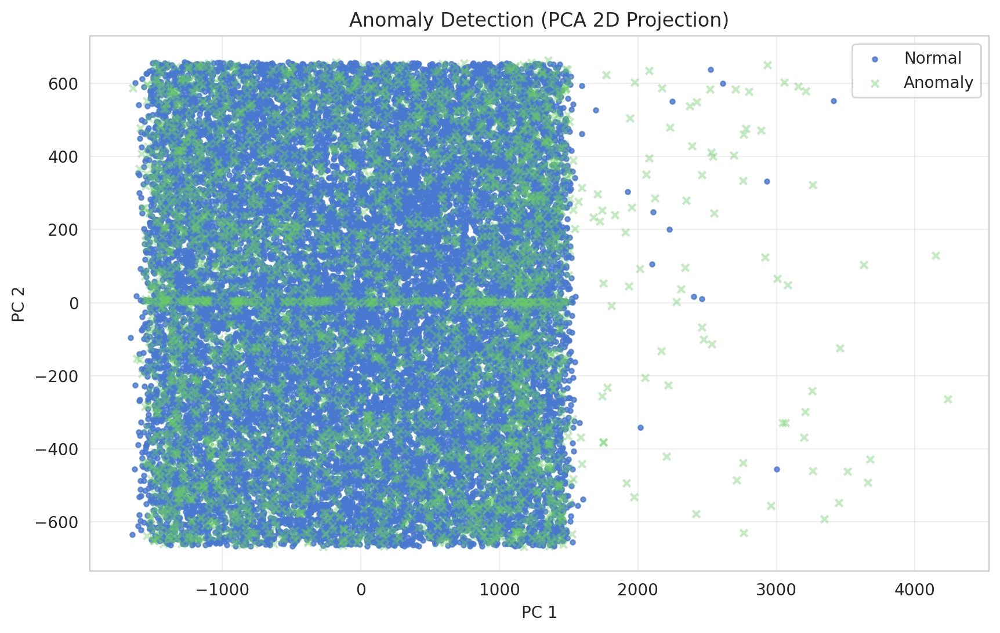

In [ ]:
# plot_anomalies(df_imputed, anomaly_labels)

In [79]:
from sklearn.ensemble import IsolationForest

iso_forest = IsolationForest(n_estimators=500, contamination=0.15, random_state=42, max_samples='auto')
iso_forest.fit(df_scaled)
anomaly_scores = iso_forest.decision_function(df_scaled)
anomaly_labels = (iso_forest.predict(df_scaled) == -1).astype(int)

,n_estimators,500
,max_samples,'auto'
,contamination,0.15
,max_features,1.0
,bootstrap,False
,n_jobs,None
,random_state,42
,verbose,0
,warm_start,False


In [80]:
# for label in anomaly_labels:
#     if label == np.nan:
#         print('f')

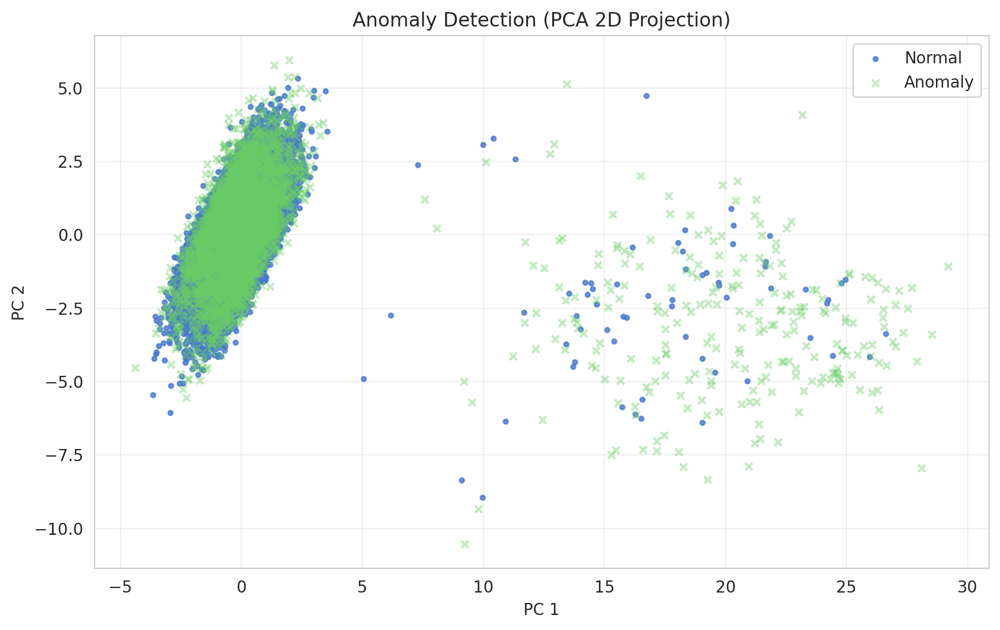

In [81]:
plot_anomalies(df_scaled, anomaly_labels)

### Transformed

In [82]:
iso_forest = IsolationForest(n_estimators=500, contamination=0.15, random_state=42, max_samples='auto')
iso_forest.fit(df_transformed)
anomaly_scores_transformed = iso_forest.decision_function(df_scaled)
anomaly_labels_transformed = (iso_forest.predict(df_scaled) == -1).astype(int)

,n_estimators,500
,max_samples,'auto'
,contamination,0.15
,max_features,1.0
,bootstrap,False
,n_jobs,None
,random_state,42
,verbose,0
,warm_start,False


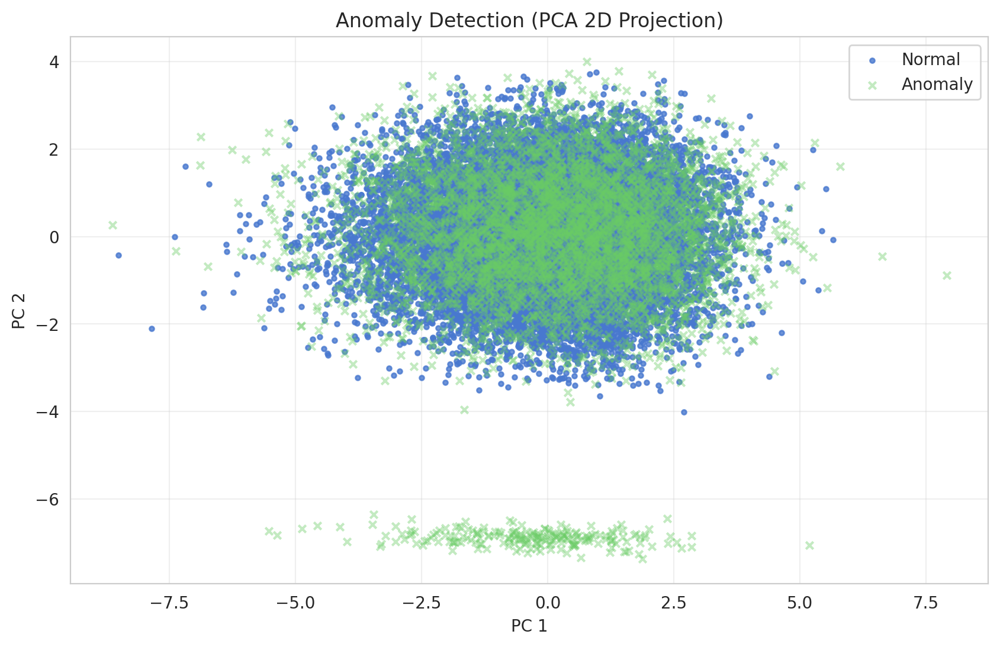

In [83]:
plot_anomalies(df_transformed, anomaly_labels_transformed)

# One Class SVM

In [ ]:
# from sklearn.svm import OneClassSVM

# oc_svm = OneClassSVM(nu=0.15, kernel="rbf", gamma='scale')
# oc_svm.fit(df_imputed)
# svm_anomaly_scores = oc_svm.decision_function(df_imputed)
# svm_anomaly_labels = (oc_svm.predict(df_imputed) == -1).astype(int)

,kernel,'rbf'
,degree,3
,gamma,'scale'
,coef0,0.0
,tol,0.001
,nu,0.15
,shrinking,True
,cache_size,200
,verbose,False
,max_iter,-1


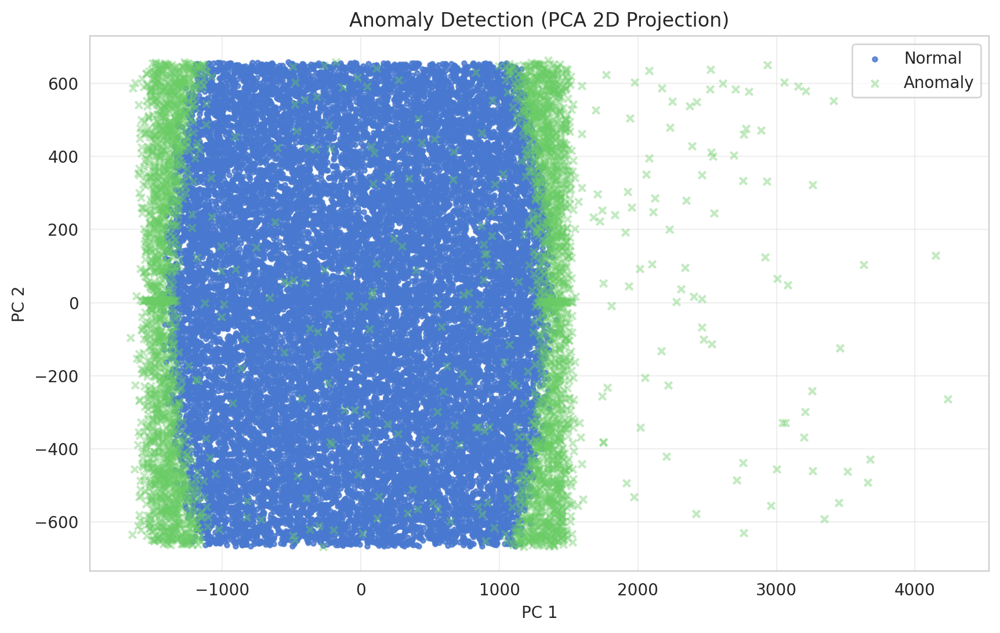

In [ ]:
# plot_anomalies(df_imputed, svm_anomaly_labels)

In [86]:
from sklearn.svm import OneClassSVM

oc_svm = OneClassSVM(nu=0.15, kernel="rbf", gamma='scale')
oc_svm.fit(df_scaled)
svm_anomaly_scores = oc_svm.decision_function(df_scaled)
svm_anomaly_labels = (oc_svm.predict(df_scaled) == -1).astype(int)

,kernel,'rbf'
,degree,3
,gamma,'scale'
,coef0,0.0
,tol,0.001
,nu,0.15
,shrinking,True
,cache_size,200
,verbose,False
,max_iter,-1


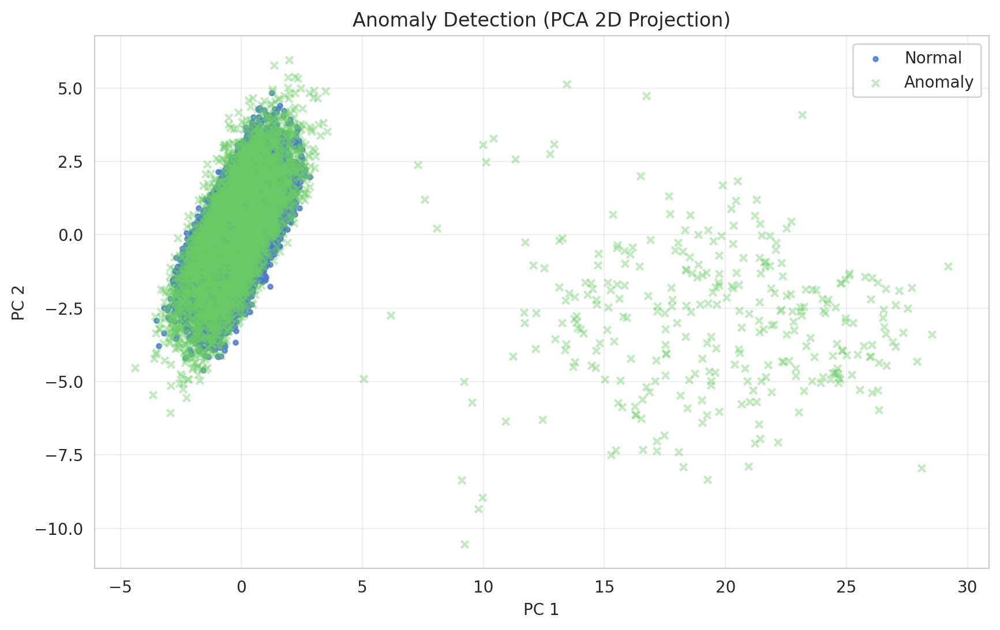

In [87]:
plot_anomalies(df_scaled, svm_anomaly_labels)

### Transformed

In [88]:
oc_svm = OneClassSVM(nu=0.15, kernel="rbf", gamma='scale')
oc_svm.fit(df_transformed)
svm_anomaly_scores_transformed = oc_svm.decision_function(df_transformed)
svm_anomaly_labels_transformed = (oc_svm.predict(df_transformed) == -1).astype(int)

,kernel,'rbf'
,degree,3
,gamma,'scale'
,coef0,0.0
,tol,0.001
,nu,0.15
,shrinking,True
,cache_size,200
,verbose,False
,max_iter,-1


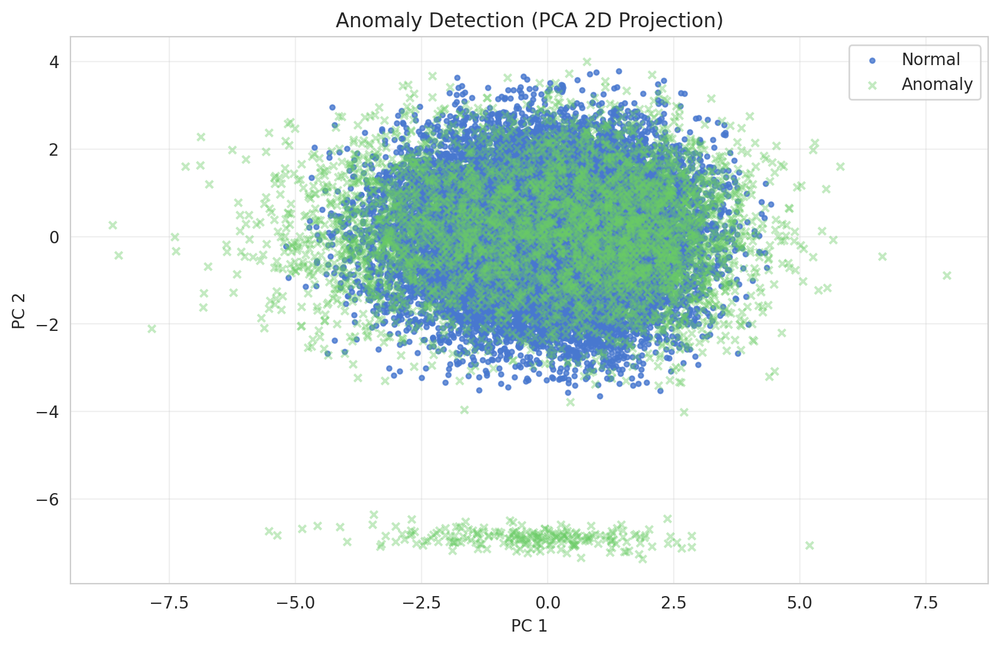

In [89]:
plot_anomalies(df_transformed, svm_anomaly_labels_transformed)

# Auto Encoder

In [ ]:
# import tensorflow as tf
# from tensorflow import keras

# input_dim = df_scaled.shape[1]
# BATCH_SIZE = 256
# EPOCHS = 100


# autoencoder = keras.models.Sequential([
    
#     # deconstruct / encode
#     tf.keras.layers.Dense(input_dim, activation='elu', input_shape=(input_dim, )),
#     tf.keras.layers.Dense(128, activation='elu'),
#     tf.keras.layers.Dense(64, activation='elu'),
#     tf.keras.layers.Dense(32, activation='elu'),
#     tf.keras.layers.Dense(16, activation='elu'),
#     # tf.keras.layers.Dense(8, activation='elu'),
#     # tf.keras.layers.Dense(4, activation='elu'),
#     # tf.keras.layers.Dense(2, activation='elu'),
    
#     # reconstruction / decode
#     # tf.keras.layers.Dense(4, activation='elu'),
#     # tf.keras.layers.Dense(8, activation='elu'),
#     # tf.keras.layers.Dense(16, activation='elu'),
#     tf.keras.layers.Dense(32, activation='elu'),
#     tf.keras.layers.Dense(64, activation='elu'),
#     tf.keras.layers.Dense(128, activation='elu'),
#     tf.keras.layers.Dense(input_dim, activation='elu')
    
# ])

# autoencoder.compile(optimizer="adam", 
#                     loss="mse",
#                     metrics=["acc"])

# autoencoder.summary()

Model: "sequential_4"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_36 (Dense)                │ (None, 122)            │        15,006 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_37 (Dense)                │ (None, 128)            │        15,744 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_38 (Dense)                │ (None, 64)             │         8,256 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_39 (Dense)                │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_40 (Dense)                │ (None, 16)             │           528 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_41 (Dense)                │ (None, 32)             │           544 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_42 (Dense)                │ (None, 64)             │         2,112 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_43 (Dense)                │ (None, 128)            │         8,320 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_44 (Dense)                │ (None, 122)            │        15,738 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 68,328 (266.91 KB)

 Trainable params: 68,328 (266.91 KB)

 Non-trainable params: 0 (0.00 B)

In [ ]:
# history = autoencoder.fit(
#     x=df_imputed, 
#     y=df_imputed,
#     shuffle=True,
#     epochs=EPOCHS,
#     batch_size=BATCH_SIZE,
)

Epoch 1/100
102/102 ━━━━━━━━━━━━━━━━━━━━ 7s 26ms/step - acc: 0.2208 - loss: 41118.2734 
Epoch 2/100
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - acc: 0.2356 - loss: 31000.1074
Epoch 3/100
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - acc: 0.2797 - loss: 3610.2700
Epoch 4/100
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - acc: 0.2895 - loss: 1965.8525
Epoch 5/100
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - acc: 0.2942 - loss: 1934.2078
Epoch 6/100
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - acc: 0.2989 - loss: 1857.7601
Epoch 7/100
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - acc: 0.2978 - loss: 1825.1262
Epoch 8/100
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - acc: 0.3175 - loss: 1663.1777
Epoch 9/100
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - acc: 0.3303 - loss: 1367.0233
Epoch 10/100
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - acc: 0.3266 - loss: 1314.8630
Epoch 11/100
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - acc: 0.3204 - loss: 1309.7330
Epoch 12/100
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - acc

In [ ]:
# reconstructions = autoencoder.predict(df_imputed)
# mse = np.mean(np.power(df_imputed - reconstructions, 2), axis=1)

# # Convert to binary (0/1) based on threshold
# threshold = np.percentile(mse, 85)  # Top 20% as anomalies (1)
# autoencoder_anomaly_labels = (mse > threshold).astype(int)

810/810 ━━━━━━━━━━━━━━━━━━━━ 4s 2ms/step


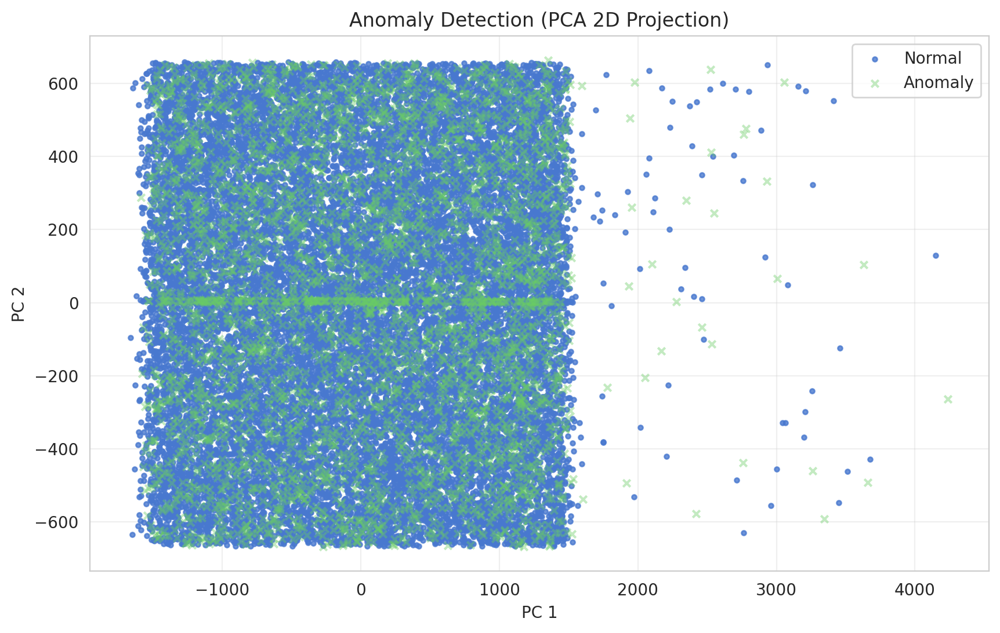

In [ ]:
# plot_anomalies(df_imputed, autoencoder_anomaly_labels)

In [ ]:
import tensorflow as tf
from tensorflow import keras

input_dim = df_scaled.shape[1]
BATCH_SIZE = 256
EPOCHS = 100

autoencoder = keras.models.Sequential([
    
    # deconstruct / encode
    tf.keras.layers.Dense(input_dim, activation='elu', input_shape=(input_dim, )),
    tf.keras.layers.Dense(128, activation='elu'),
    tf.keras.layers.Dense(64, activation='elu'),
    tf.keras.layers.Dense(32, activation='elu'),
    tf.keras.layers.Dense(16, activation='elu'),
    # tf.keras.layers.Dense(8, activation='elu'),
    # tf.keras.layers.Dense(4, activation='elu'),
    # tf.keras.layers.Dense(2, activation='elu'),
    
    # reconstruction / decode
    # tf.keras.layers.Dense(4, activation='elu'),
    # tf.keras.layers.Dense(8, activation='elu'),
    # tf.keras.layers.Dense(16, activation='elu'),
    tf.keras.layers.Dense(32, activation='elu'),
    tf.keras.layers.Dense(64, activation='elu'),
    tf.keras.layers.Dense(128, activation='elu'),
    tf.keras.layers.Dense(input_dim, activation='elu')
    
])

autoencoder.compile(optimizer="adam", 
                    loss="mse",
                    metrics=["acc"])

autoencoder.summary()

Model: "sequential_5"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_45 (Dense)                │ (None, 122)            │        15,006 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_46 (Dense)                │ (None, 128)            │        15,744 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_47 (Dense)                │ (None, 64)             │         8,256 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_48 (Dense)                │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_49 (Dense)                │ (None, 16)             │           528 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_50 (Dense)                │ (None, 32)             │           544 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_51 (Dense)                │ (None, 64)             │         2,112 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_52 (Dense)                │ (None, 128)            │         8,320 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_53 (Dense)                │ (None, 122)            │        15,738 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 68,328 (266.91 KB)

 Trainable params: 68,328 (266.91 KB)

 Non-trainable params: 0 (0.00 B)

In [95]:
history = autoencoder.fit(
    x=df_scaled, 
    y=df_scaled,
    shuffle=True,
    epochs=EPOCHS,
    batch_size=BATCH_SIZE,
)

Epoch 1/100
102/102 ━━━━━━━━━━━━━━━━━━━━ 8s 27ms/step - acc: 0.1330 - loss: 0.3203
Epoch 2/100
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - acc: 0.1536 - loss: 0.2308
Epoch 3/100
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - acc: 0.1694 - loss: 0.2198
Epoch 4/100
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - acc: 0.1844 - loss: 0.2153
Epoch 5/100
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - acc: 0.1841 - loss: 0.2127
Epoch 6/100
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - acc: 0.1914 - loss: 0.2111
Epoch 7/100
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - acc: 0.1920 - loss: 0.2096
Epoch 8/100
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - acc: 0.1919 - loss: 0.2084
Epoch 9/100
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - acc: 0.1882 - loss: 0.2073
Epoch 10/100
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - acc: 0.1887 - loss: 0.2064
Epoch 11/100
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - acc: 0.1851 - loss: 0.2057
Epoch 12/100
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - acc: 0.1852 - loss: 0.2050
Epoch 13/100

In [96]:
reconstructions = autoencoder.predict(df_scaled)
mse = np.mean(np.power(df_scaled - reconstructions, 2), axis=1)

# Convert to binary (0/1) based on threshold
threshold = np.percentile(mse, 85)  # Top 20% as anomalies (1)
autoencoder_anomaly_labels = (mse > threshold).astype(int)

810/810 ━━━━━━━━━━━━━━━━━━━━ 4s 2ms/step


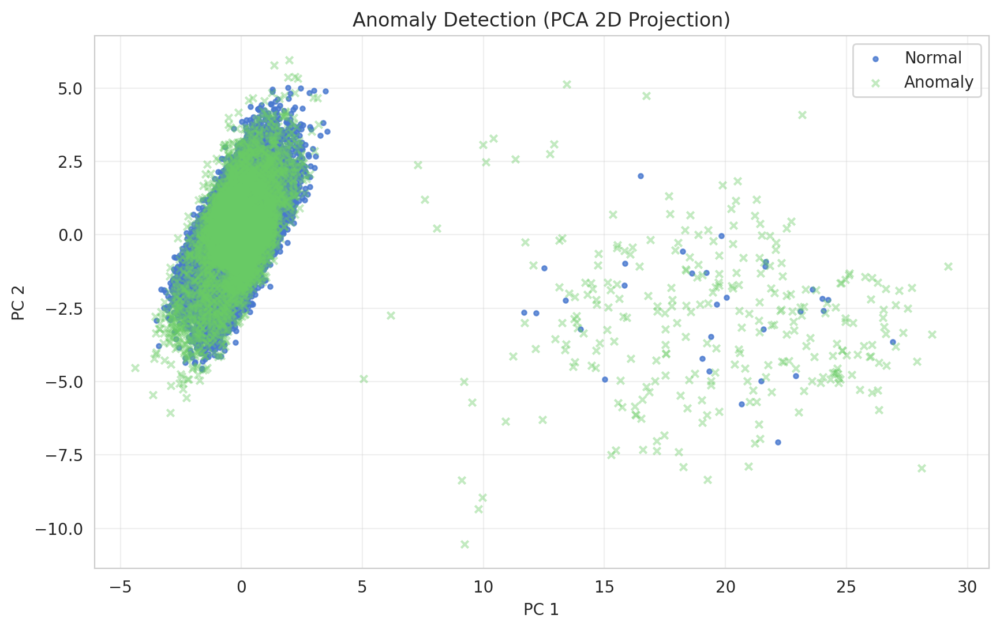

In [97]:
plot_anomalies(df_scaled, autoencoder_anomaly_labels)

### Transformed

In [98]:
autoencoder = keras.models.Sequential([
    
    # deconstruct / encode
    tf.keras.layers.Dense(input_dim, activation='elu', input_shape=(input_dim, )),
    tf.keras.layers.Dense(128, activation='elu'),
    tf.keras.layers.Dense(64, activation='elu'),
    tf.keras.layers.Dense(32, activation='elu'),
    tf.keras.layers.Dense(16, activation='elu'),
    # tf.keras.layers.Dense(8, activation='elu'),
    # tf.keras.layers.Dense(4, activation='elu'),
    # tf.keras.layers.Dense(2, activation='elu'),
    
    # reconstruction / decode
    # tf.keras.layers.Dense(4, activation='elu'),
    # tf.keras.layers.Dense(8, activation='elu'),
    # tf.keras.layers.Dense(16, activation='elu'),
    tf.keras.layers.Dense(32, activation='elu'),
    tf.keras.layers.Dense(64, activation='elu'),
    tf.keras.layers.Dense(128, activation='elu'),
    tf.keras.layers.Dense(input_dim, activation='elu')
    
])

autoencoder.compile(optimizer="adam", 
                    loss="mse",
                    metrics=["acc"])

autoencoder.summary()

Model: "sequential_6"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_54 (Dense)                │ (None, 122)            │        15,006 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_55 (Dense)                │ (None, 128)            │        15,744 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_56 (Dense)                │ (None, 64)             │         8,256 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_57 (Dense)                │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_58 (Dense)                │ (None, 16)             │           528 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_59 (Dense)                │ (None, 32)             │           544 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_60 (Dense)                │ (None, 64)             │         2,112 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_61 (Dense)                │ (None, 128)            │         8,320 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_62 (Dense)                │ (None, 122)            │        15,738 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 68,328 (266.91 KB)

 Trainable params: 68,328 (266.91 KB)

 Non-trainable params: 0 (0.00 B)

In [99]:
history = autoencoder.fit(
    x=df_transformed, 
    y=df_transformed,
    shuffle=True,
    epochs=EPOCHS,
    batch_size=BATCH_SIZE,
)

Epoch 1/100
102/102 ━━━━━━━━━━━━━━━━━━━━ 8s 27ms/step - acc: 0.1100 - loss: 0.2903
Epoch 2/100
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - acc: 0.1267 - loss: 0.2171
Epoch 3/100
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - acc: 0.1309 - loss: 0.2096
Epoch 4/100
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - acc: 0.1323 - loss: 0.2069
Epoch 5/100
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - acc: 0.1279 - loss: 0.2051
Epoch 6/100
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - acc: 0.1206 - loss: 0.2040
Epoch 7/100
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - acc: 0.1196 - loss: 0.2030
Epoch 8/100
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - acc: 0.1155 - loss: 0.2019
Epoch 9/100
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - acc: 0.1144 - loss: 0.2012
Epoch 10/100
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - acc: 0.1130 - loss: 0.2003
Epoch 11/100
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - acc: 0.1107 - loss: 0.1995
Epoch 12/100
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - acc: 0.1126 - loss: 0.1988
Epoch 13/100

In [100]:
reconstructions_transformed = autoencoder.predict(df_transformed)
mse_transformed = np.mean(np.power(df_transformed - reconstructions, 2), axis=1)

# Convert to binary (0/1) based on threshold
threshold_transformed = np.percentile(mse, 85)  # Top 20% as anomalies (1)
autoencoder_anomaly_labels_transformed = (mse_transformed > threshold_transformed).astype(int)

810/810 ━━━━━━━━━━━━━━━━━━━━ 4s 2ms/step


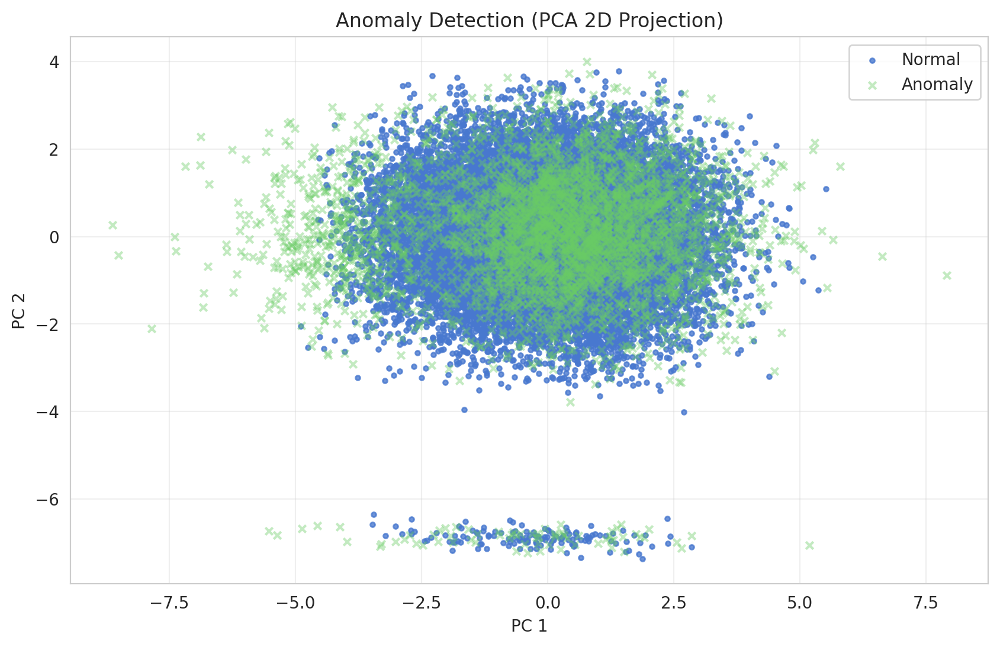

In [101]:
plot_anomalies(df_transformed, autoencoder_anomaly_labels_transformed)

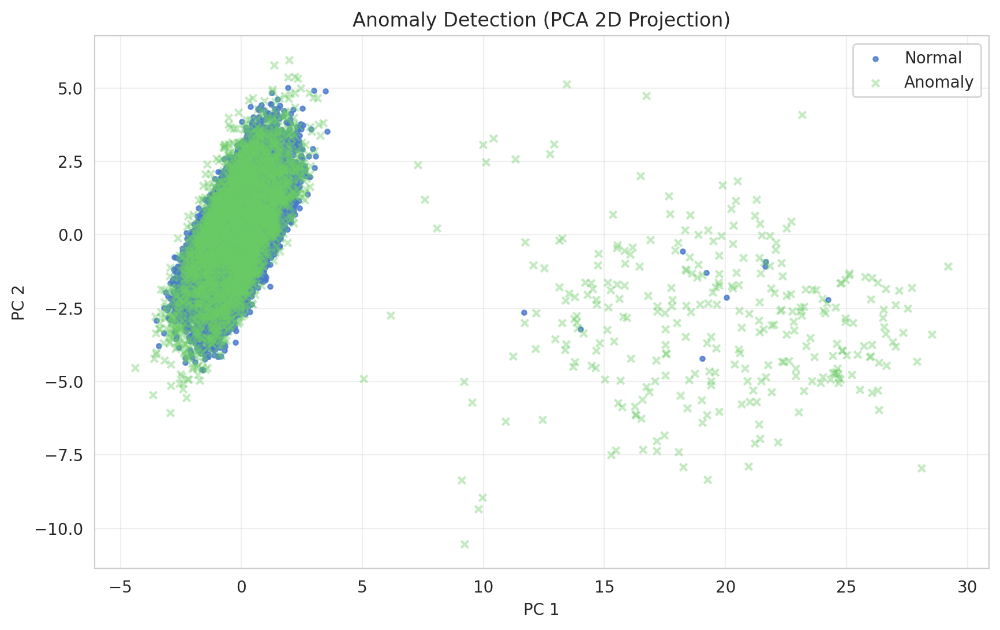

In [102]:
voting_labels = ((anomaly_labels + svm_anomaly_labels + autoencoder_anomaly_labels) >= 2 )| 0

plot_anomalies(df_scaled, voting_labels)

### Transformed

In [103]:
input_dim = df_transformed.shape[1]
BATCH_SIZE = 256
EPOCHS = 100


autoencoder = keras.models.Sequential([
    
    # deconstruct / encode
    tf.keras.layers.Dense(input_dim, activation='elu', input_shape=(input_dim, )),
    tf.keras.layers.Dense(128, activation='elu'),
    tf.keras.layers.Dense(64, activation='elu'),
    tf.keras.layers.Dense(32, activation='elu'),
    tf.keras.layers.Dense(16, activation='elu'),
    # tf.keras.layers.Dense(8, activation='elu'),
    # tf.keras.layers.Dense(4, activation='elu'),
    # tf.keras.layers.Dense(2, activation='elu'),
    
    # reconstruction / decode
    # tf.keras.layers.Dense(4, activation='elu'),
    # tf.keras.layers.Dense(8, activation='elu'),
    # tf.keras.layers.Dense(16, activation='elu'),
    tf.keras.layers.Dense(32, activation='elu'),
    tf.keras.layers.Dense(64, activation='elu'),
    tf.keras.layers.Dense(128, activation='elu'),
    tf.keras.layers.Dense(input_dim, activation='elu')
    
])

autoencoder.compile(optimizer="adam", 
                    loss="mse",
                    metrics=["acc"])

autoencoder.summary();

Model: "sequential_7"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_63 (Dense)                │ (None, 122)            │        15,006 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_64 (Dense)                │ (None, 128)            │        15,744 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_65 (Dense)                │ (None, 64)             │         8,256 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_66 (Dense)                │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_67 (Dense)                │ (None, 16)             │           528 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_68 (Dense)                │ (None, 32)             │           544 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_69 (Dense)                │ (None, 64)             │         2,112 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_70 (Dense)                │ (None, 128)            │         8,320 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_71 (Dense)                │ (None, 122)            │        15,738 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 68,328 (266.91 KB)

 Trainable params: 68,328 (266.91 KB)

 Non-trainable params: 0 (0.00 B)

In [104]:
history_transformed = autoencoder.fit(
    x=df_transformed, 
    y=df_transformed,
    shuffle=True,
    epochs=EPOCHS,
    batch_size=BATCH_SIZE,
)

Epoch 1/100
102/102 ━━━━━━━━━━━━━━━━━━━━ 8s 27ms/step - acc: 0.1257 - loss: 0.2980
Epoch 2/100
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - acc: 0.1487 - loss: 0.2259
Epoch 3/100
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - acc: 0.1555 - loss: 0.2107
Epoch 4/100
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - acc: 0.1506 - loss: 0.2073
Epoch 5/100
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - acc: 0.1451 - loss: 0.2054
Epoch 6/100
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - acc: 0.1372 - loss: 0.2039
Epoch 7/100
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - acc: 0.1359 - loss: 0.2028
Epoch 8/100
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - acc: 0.1274 - loss: 0.2017
Epoch 9/100
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - acc: 0.1250 - loss: 0.2008
Epoch 10/100
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - acc: 0.1222 - loss: 0.1999
Epoch 11/100
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - acc: 0.1185 - loss: 0.1989
Epoch 12/100
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - acc: 0.1197 - loss: 0.1981
Epoch 13/100

In [105]:
reconstructions_transformed = autoencoder.predict(df_transformed)
mse_transformed = np.mean(np.power(df_transformed - reconstructions, 2), axis=1)

# Convert to binary (0/1) based on threshold
threshold_transformed = np.percentile(mse, 85)  # Top 20% as anomalies (1)
autoencoder_anomaly_labels_transformed = (mse > threshold).astype(int)

810/810 ━━━━━━━━━━━━━━━━━━━━ 4s 2ms/step


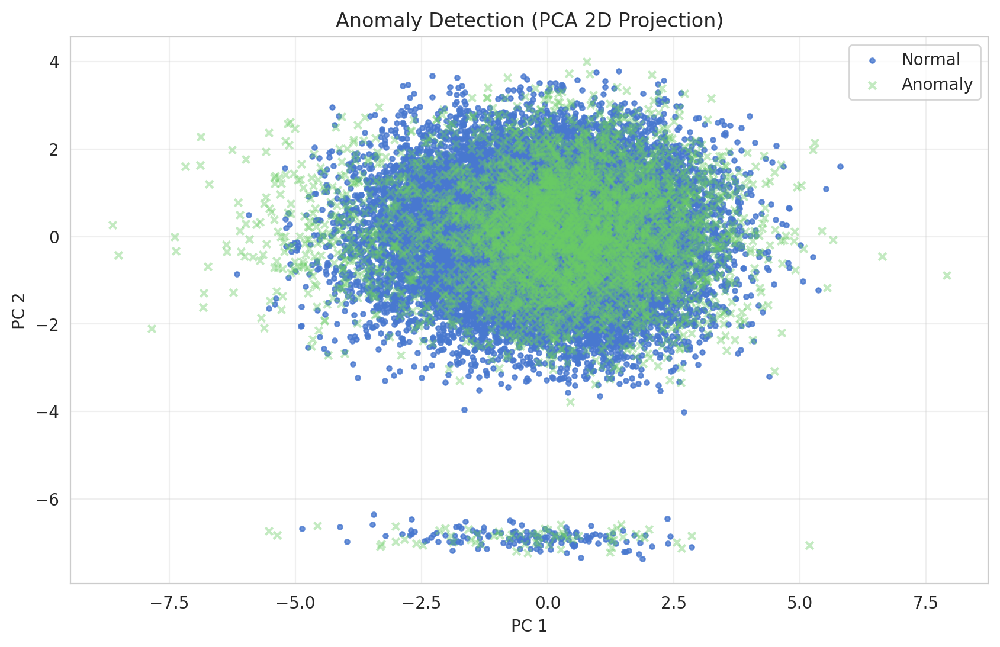

In [106]:
plot_anomalies(df_transformed, autoencoder_anomaly_labels_transformed)

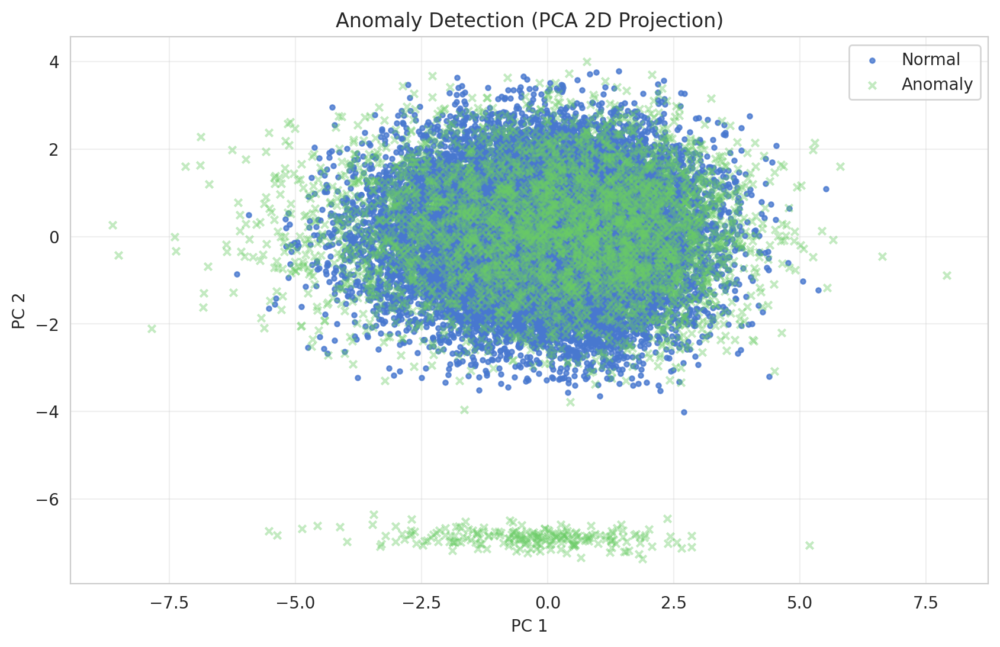

In [107]:
voting_labels_transformed = ((anomaly_labels_transformed + svm_anomaly_labels_transformed + autoencoder_anomaly_labels_transformed) >= 2 )| 0

plot_anomalies(df_transformed, voting_labels_transformed)

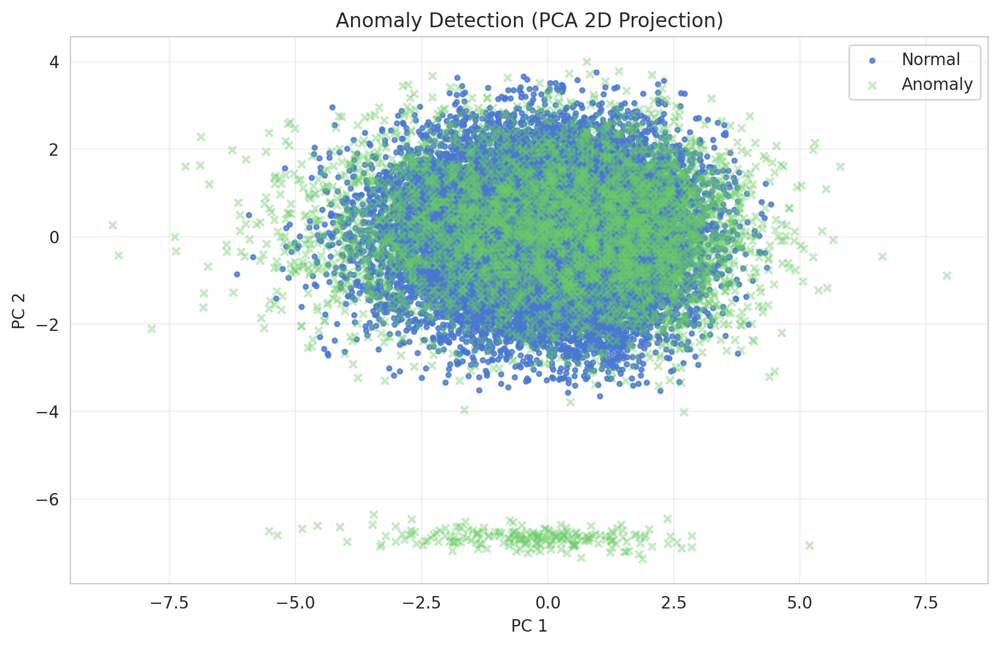

In [108]:
plot_anomalies(df_transformed, svm_anomaly_labels)

In [ ]:
col_only = pd.DataFrame(voting_labels_transformed, columns=['task5'])
col_only.to_csv('Voting15percent_robustScaled_BetterMedian_noTrend_Transformed.csv', index=False)
res = pd.read_csv('fixindex_new_tesk2_stacking_newfetureeng.csv')
# res['task5'] = voting_labels
# res.to_csv('fixindex_new_tesk2_stacking_newfetureeng+Voting15percent_robustScaled_BetterMedian_noTrend_Transformed.csv', index=False)

In [ ]:
col_only = pd.DataFrame(voting_labels, columns=['task5'])
col_only.to_csv('Voting15percent_robustScaled_BetterMedian_noTrend.csv', index=False)
# res = pd.read_csv('fixindex_new_tesk2_stacking_newfetureeng.csv')
# res['task5'] = voting_labels
# res.to_csv('fixindex_new_tesk2_stacking_newfetureeng+Voting15percent_robustScaled_BetterMedian_Trend.csv', index=False)

In [ ]:
col_only = pd.DataFrame(svm_anomaly_labels, columns=['task5'])
col_only.to_csv('OneCSVM15percent_robustScaled_BetterMedian_noTrend.csv', index=False)
# res['task5'] = svm_anomaly_labels
# res.to_csv('fixindex_new_tesk2_stacking_newfetureeng+OneCSVM15percent_robustScaled_BetterMedian_Trend.csv', index=False)